In [1]:
#Import useful libraries 

import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
%matplotlib inline

# Camera Calibration

## Step 1: Extract object points (real world) and image points (image plane) for camera calibration.

In [2]:
# Prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

In [3]:
# Create empty arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

In [4]:
# Import the images
images = glob.glob('camera_cal/calibration*.jpg')

In [5]:
# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        #write_name = 'corners_found'+str(idx)+'.jpg'
        #cv2.imwrite(write_name, img)
        #cv2.imshow('img', img)
        #cv2.waitKey(500)
#cv2.destroyAllWindows()  

## Step 2: Calibrate, calculate distortion coefficients, and test undistortion on an image. 

In [6]:
# Test undistortion on an image
img = cv2.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

In [7]:
# Perform camera calibration given object points and image points found in step 1
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

dst = cv2.undistort(img, mtx, dist, None, mtx)
#cv2.imwrite('calibration_wide/test_undist.jpg',dst)

In [8]:
# Save the camera calibration results for later use.
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "camera_cal/wide_dist_pickle.p", "wb" ) )
#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)

# Pipeline (test images) 

## Apply distortion correction on a test image  

In [11]:
# Import the test image
test_imgs = glob.glob('test_images/*.jpg')

In [12]:
# Define undistortion function
def undistort (image):
    return  cv2.undistort(image, mtx, dist, None, mtx)

True

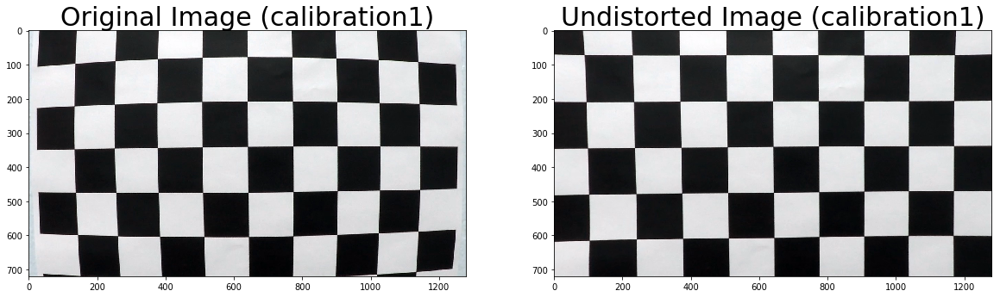

In [9]:
# Test undistortion on an image
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image (calibration1)', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image (calibration1)', fontsize=30)

# Save the test image
cv2.imwrite('output_images/test_undist_calibration1.jpg',dst)

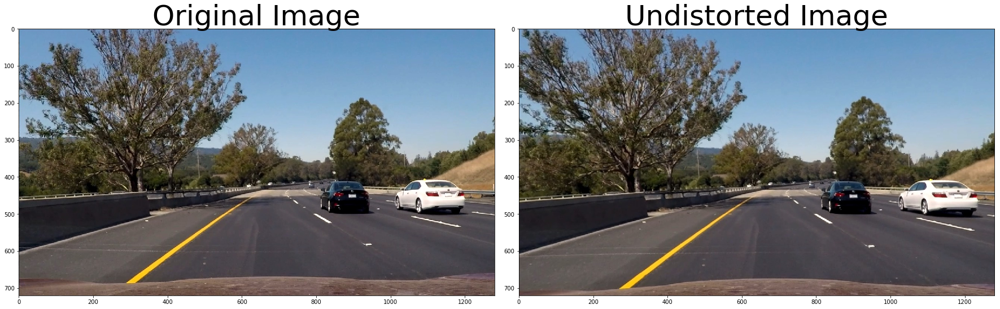

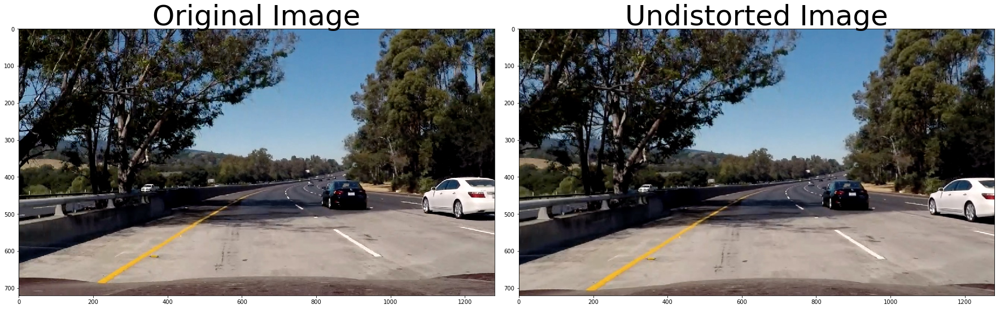

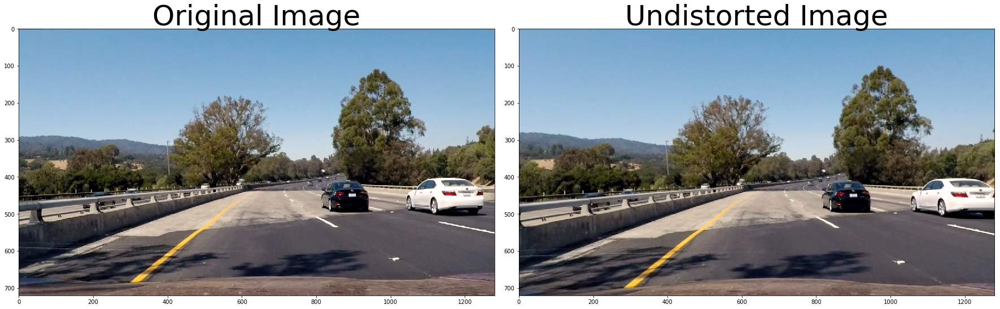

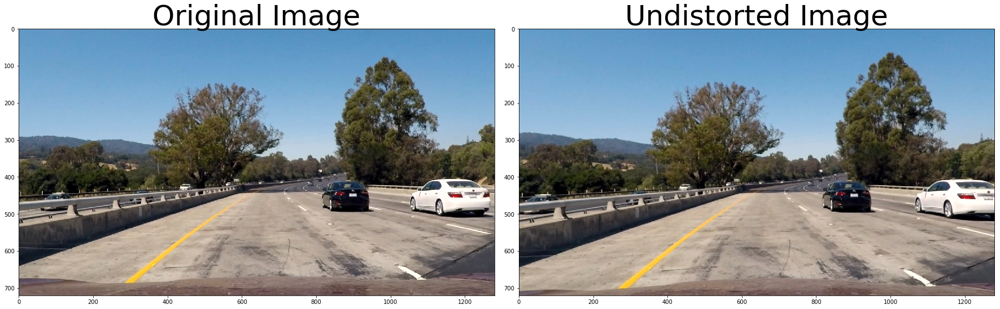

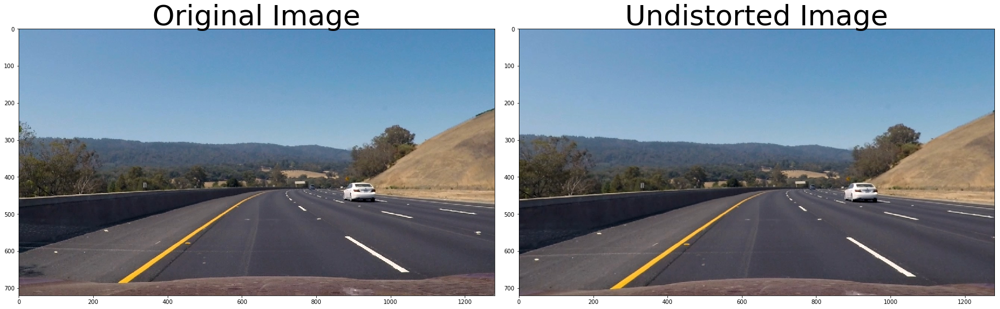

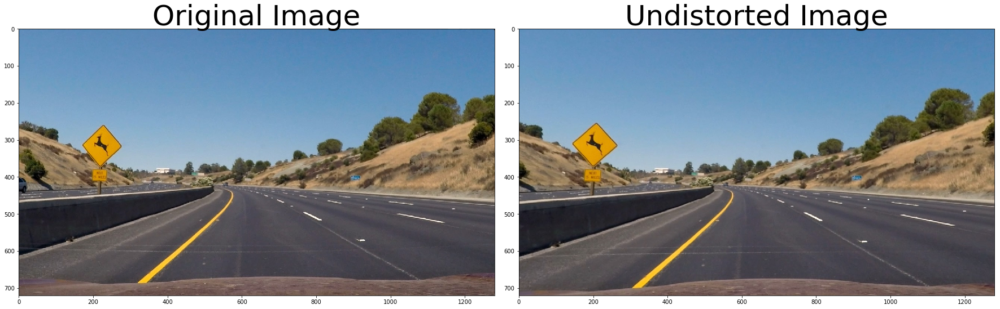

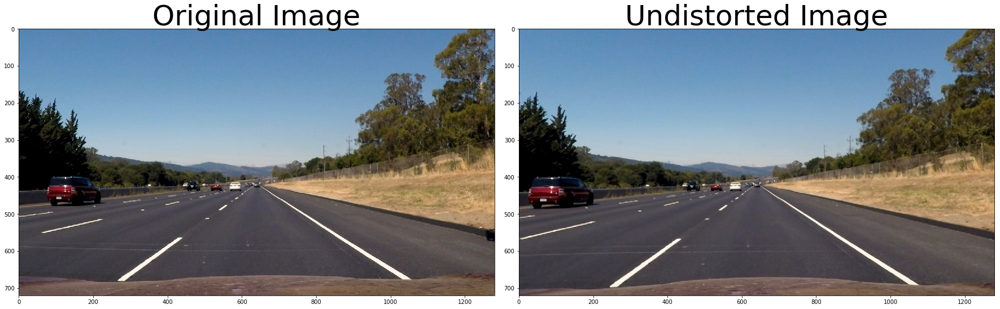

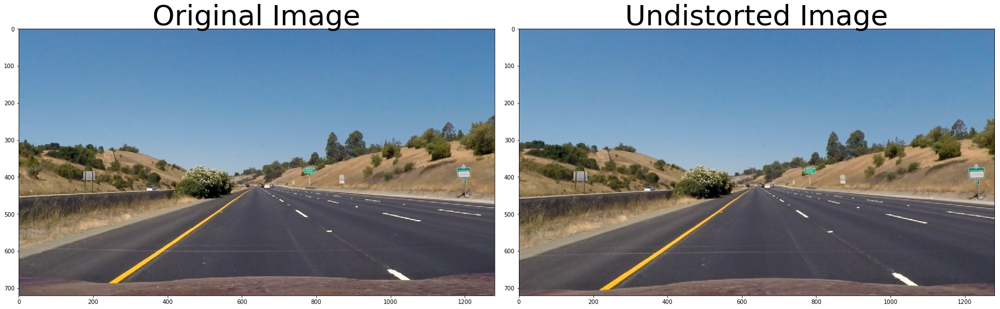

In [13]:
for test_img in test_imgs:
    
    image = cv2.imread(test_img)
    img = np.copy(image)
    
    # Test undistortion 
    undist_img = undistort(img)
    
    file_name = "output_images/Undistorted_"+test_img[12:]
    
    # Save the test image
    cv2.imwrite(file_name,undist_img)

    #To get RGB images 
    r,g,b = cv2.split(img)
    img = cv2.merge((b,g,r))

    r,g,b = cv2.split(undist_img)
    undist_img = cv2.merge((b,g,r))
    


    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(undist_img)
    ax2.set_title('Undistorted Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)





## Create a thresholded binary image using color transforms and gradients 

In [14]:
# Calculate directional gradient
def abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(0, 255)):


    # 1) Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # 6) Return this mask as your binary_output image
    return grad_binary


# Calculate gradient magnitude
def mag_thresh(image, sobel_kernel=3, mag_thresh=(0, 255)):


    # 1) Convert to grayscale
    gray = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    # 3) Calculate the magnitude    
    abs_sobel = np.sqrt((sobelx*sobelx)+(sobely*sobely))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a binary mask where mag thresholds are met
    mag_binary = np.zeros_like(scaled_sobel)
    mag_binary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return mag_binary

# Calculate gradient direction
def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    direction = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    dir_binary = np.zeros_like(direction)
    dir_binary[(direction >= thresh[0]) & (direction <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image

    return dir_binary

# Color threshold 
def color_threshold (image, s_thresh=(0, 255), l_thresh=(0, 255)):
    
    image = np.copy(image)
    
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB).astype(np.float)
    
    l_channel = lab[:,:,0]
    s_channel = hls[:,:,2]
    
    # Threshold color s_channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    # Threshold color l_channel
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
   
    combined_binary = np.zeros_like(s_binary)
    combined_binary[(s_binary == 1) & (l_binary == 1)] = 1

    return combined_binary



### Test on images 

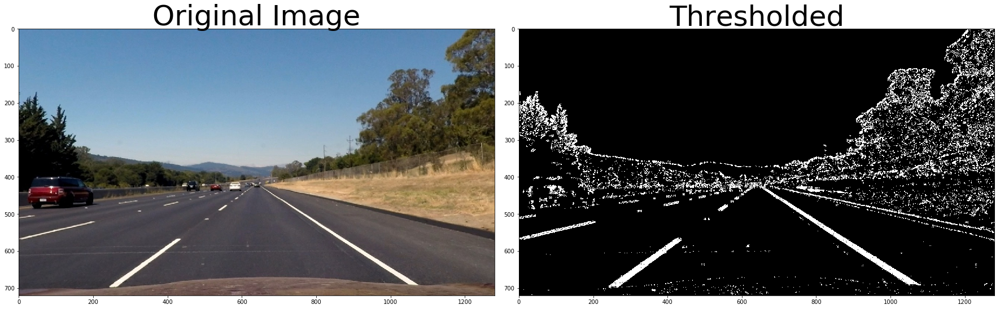

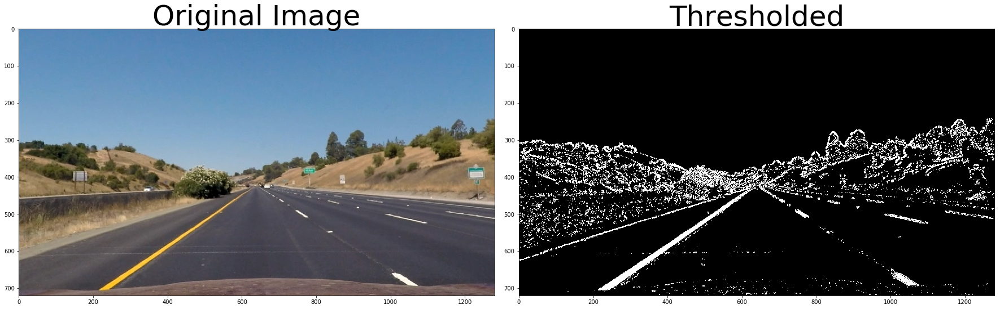

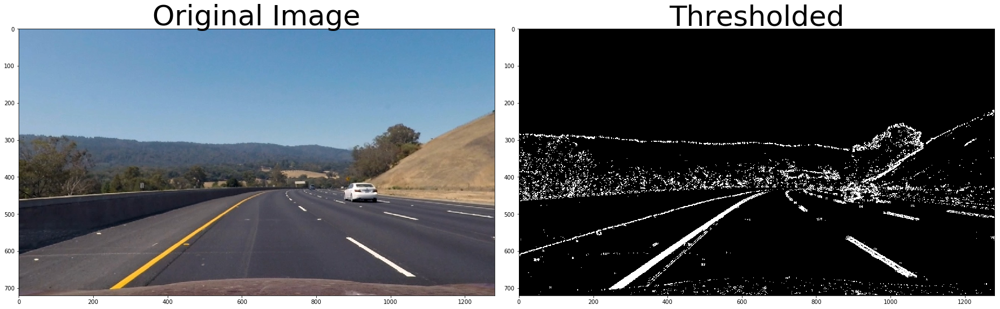

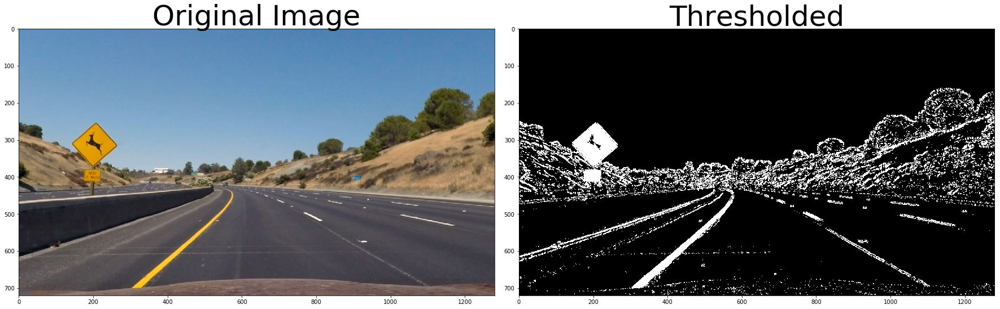

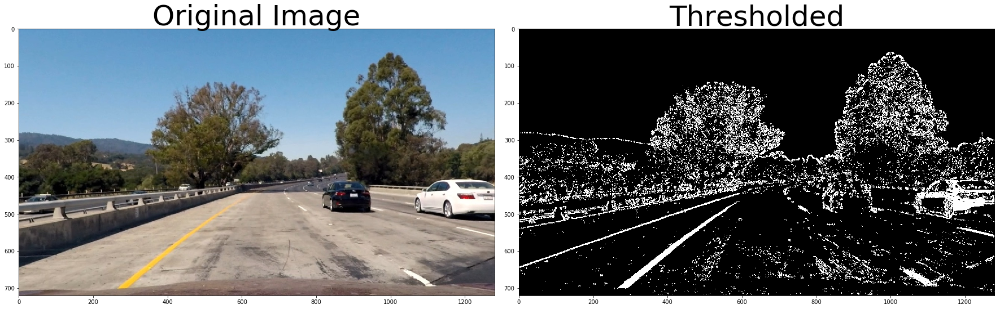

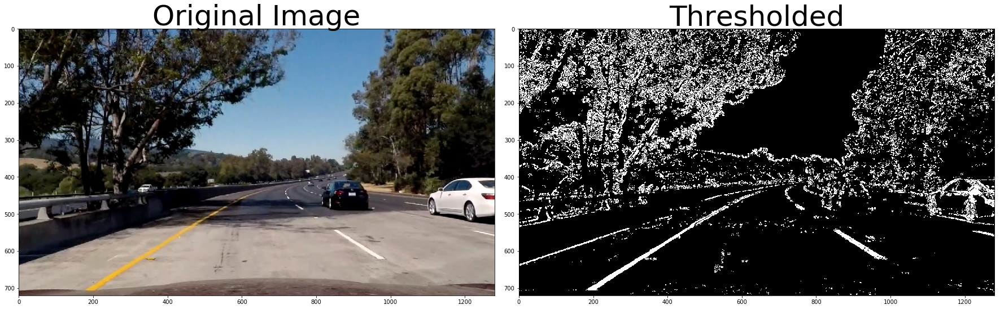

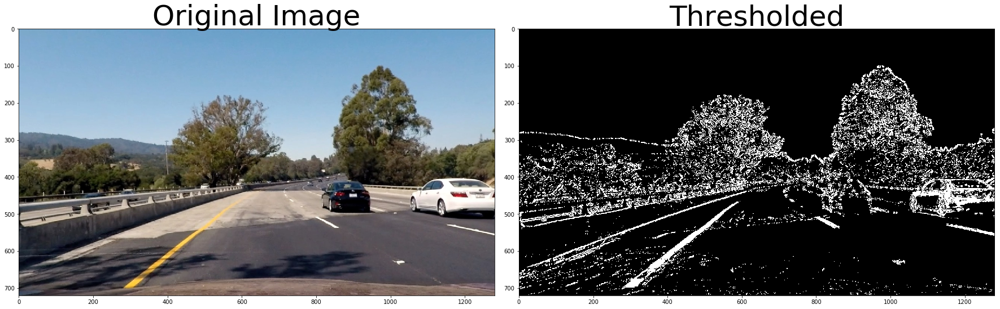

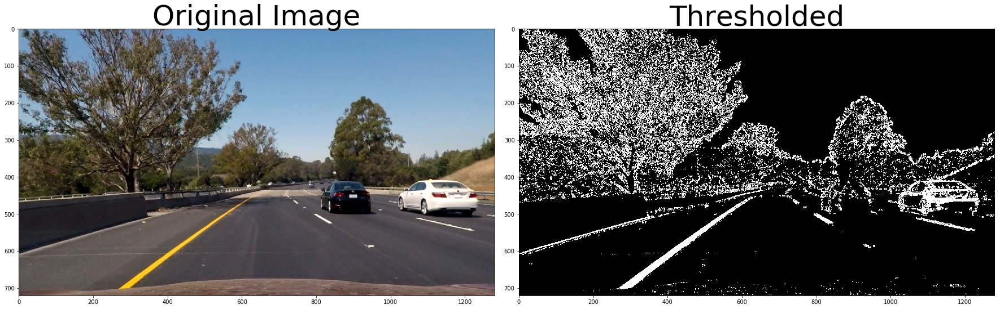

In [185]:
# Choose a Sobel kernel size
ksize = 5 # Choose a larger odd number to smooth gradient measurements

# Import the test image
test_imgs = glob.glob('output_images/Undistorted_*.jpg')

for test_img in test_imgs: 
    
    image = cv2.imread(test_img)
    img = np.copy(image)
    
    #To get RGB images 
    r,g,b = cv2.split(img)
    img = cv2.merge((b,g,r))
    
    # Apply each of the gradient thresholding functions
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh=(10, 150))
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel=ksize, thresh=(10, 150))
    mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(100, 225))
    dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=(0.7, 1.4))

    # Combine the thresholds
    grad_combined = np.zeros_like(dir_binary)
    grad_combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    # Apply color threshold 
    color = color_threshold(img, (150, 255), (100, 255))
    
    # Combine the gradients and color thresholds
    result = np.zeros_like(grad_combined)
    result[(color == 1) | (grad_combined == 1)] = 1
        
    
    # Visualization 
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(result, cmap='gray')
    ax2.set_title('Thresholded', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    # Save the test image
    file_name = "output_images/Thresholded_"+test_img[26:]
    result = result * 255
    cv2.imwrite(file_name,result)


## Perspective transform 

In [244]:
# Define 4 source points in the unwarped image. The tuple represent (x,y) coordinates 
src = np.float32([(678,443),(605,443),(285,665),(1019,665)]) # in x,y order not matrix convention
# Define 4 source points in the wrapped image
dst = np.float32([(1019-100,0),(285,0),(285,665),(1019-100,665)])

lane_width = 1019 - 285 - 100 # Lane width after transformation
unwarped_vehicle_center = (1240/2 - 285)/(1019-285) * (lane_width) + 285

# Takes undistorted/binary image and apply perspective transform on it
def warp_image (binary_img, src, dst):
    img_size = (binary_img.shape[1],binary_img.shape[0])
    # Find the transform matrix, M
    M = cv2.getPerspectiveTransform(src, dst)
    # Warp your image to a top-down view
    warped = cv2.warpPerspective(binary_img, M, img_size, flags=cv2.INTER_LINEAR)

    return warped, M
    
def unwarp_image (dst, src):
    Minv = cv2.getPerspectiveTransform(dst, src)
    return (Minv)
    

### Test on images 

##  Identify lane-line pixels 

### 1) Sliding Windows and Fit a Polynomial

In [187]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin # Update this
        win_xleft_high = leftx_current + margin # Update this
        win_xright_low = rightx_current - margin # Update this
        win_xright_high = rightx_current + margin # Update this
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 

        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high) & (nonzeroy >= win_y_low) & (nonzeroy < win_y_high)).nonzero()[0]
        good_right_inds = ((nonzerox >= win_xright_low) & (nonzerox < win_xright_high) & (nonzeroy >= win_y_low) & (nonzeroy < win_y_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### TO-DO: If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))                       
                             

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

In [188]:
def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    ### TO-DO: Fit a second order polynomial to each using `np.polyfit` ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)


    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')

    return out_img, left_fit, right_fit

### 2) Use the previous polynomial to skip the sliding window 

In [189]:
def fit_poly(img_shape, leftx, lefty, rightx, righty):
    ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

In [405]:
def search_around_poly(binary_warped, left_fit, right_fit):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    return result

In [363]:
def lane_projection (undistorted_image ,binary_warped, left_fit, right_fit):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    #plt.imshow(color_warp)

    # Recast the x and y points into usable format for cv2.fillPoly()
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    Minv = unwarp_image(dst, src)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undistorted_image.shape[1], undistorted_image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undistorted_image, 1, newwarp, 0.3, 0)
    return result
    #plt.imshow(result)
    #plt.show()

### Test on images 

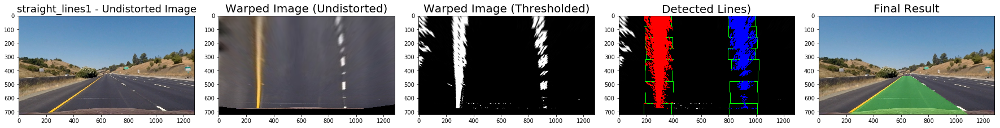

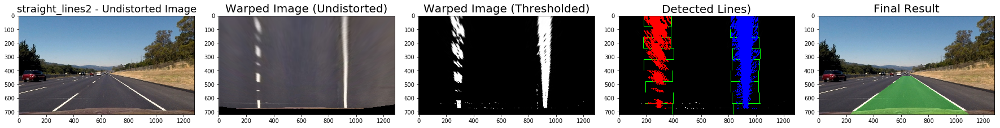

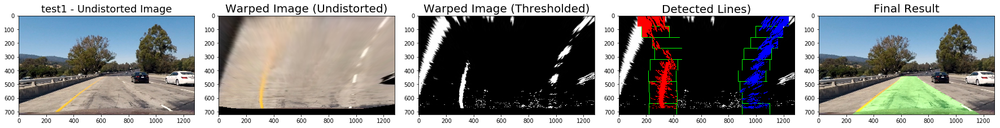

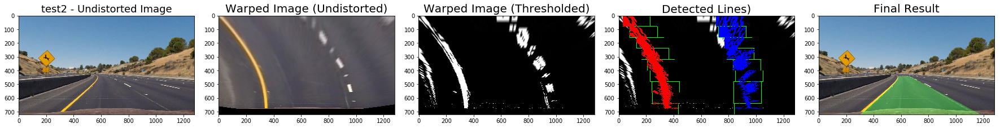

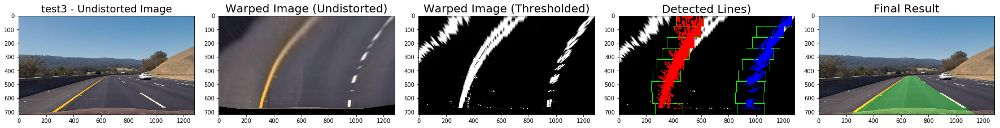

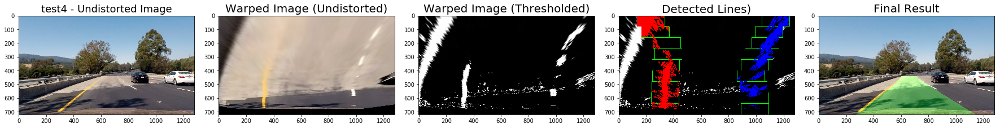

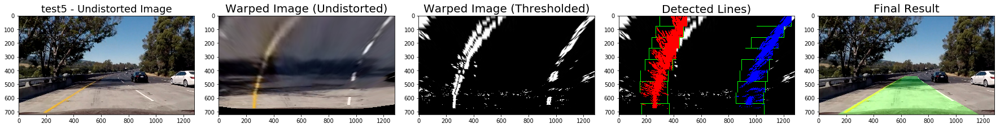

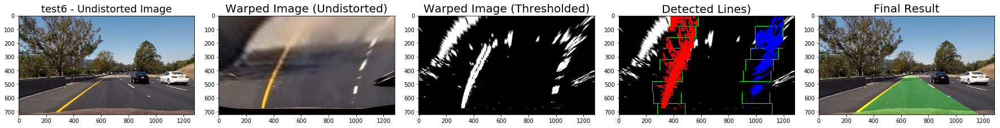

In [364]:
# Import the test images (Undistorted and Thresholded)
test_imgs = glob.glob('output_images/Undistorted_*.jpg')
test_imgs_th = glob.glob('output_images/Thresholded_*.jpg')
test_imgs.sort()
test_imgs_th.sort()
#print(test_imgs)
#print(test_imgs_th)

for test_img1, test_img2 in zip(test_imgs, test_imgs_th) : 
    
    
    # Visualization 
    f, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(24, 50))
    f.tight_layout()
    
    # Get images
    image1 = cv2.imread(test_img1)
    img1 = np.copy(image1)
    
    # To get RGB images 
    r,g,b = cv2.split(img1)
    img1 = cv2.merge((b,g,r))
    
    # Plot the undistorted image
    ax1.imshow(img1)
    ax1.set_title(test_img1[26:-4] + ' - Undistorted Image' , fontsize=18)
    
    image2 = cv2.imread(test_img2)
    img2 = np.copy(image2)
    

    
    img_size1 = (img1.shape[1],img1.shape[0])
    img_size2 = (img2.shape[1],img2.shape[0])
    
    # Apply the warp_image function to get the warped output along with the transform matrix, M    
    warped1, M1 = warp_image (img1, src, dst)
    ax2.imshow(warped1)
    ax2.set_title('Warped Image (Undistorted)', fontsize=20)
    
    warped2, M2 = warp_image (img2, src, dst)
    warped2 = cv2.cvtColor(warped2, cv2.COLOR_RGB2GRAY)
    ax3.imshow(warped2, cmap = 'gray')
    ax3.set_title('Warped Image (Thresholded)', fontsize=20)
    
    out_img, left_fit, right_fit = fit_polynomial(warped2)
    detect_lines = search_around_poly(warped2, left_fit, right_fit )
    ax4.imshow(out_img)
    ax4.set_title('Detected Lines)', fontsize=20)
    
    
    final_projection = lane_projection(img1,warped2, left_fit, right_fit)
    ax5.imshow(final_projection)
    ax5.set_title('Final Result', fontsize=20)
    

    # Save the test image
    file_name = "output_images/Warped_"+test_img1[26:] 
    cv2.imwrite(file_name,warped2)
    
    # Draw the lines over the images
    ##src_ = src.reshape((-1,1,2)).astype('int32')
    ##cv2.polylines(img1,[src_],True,(255,0,0),6)
    ##dst_ = dst.reshape((-1,1,2)).astype('int32')
    ##cv2.polylines(warped1,[dst_],True,(255,0,0),6)
    #cv2.polylines(warped2,[dst_],True,(255,0,0),6)
    

    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()
    

    
    
    

### Measuring Curvature

In [316]:
def measure_curvature_real(binary_warped,left_fit, right_fit):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    
    # Start by generating our fake example data
    # Make sure to feed in your real data instead in your project!
    h = binary_warped.shape[0]
    
    ploty = np.linspace(0,(h-1),h)
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    


    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2) 
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    ##### TO-DO: Implement the calculation of R_curve (radius of curvature) #####
    left_curverad = ((1+(2*left_fit_cr[0]*y_eval*ym_per_pix+left_fit_cr[1])**2)**(3/2))/np.absolute(2*left_fit_cr[0])  ## Implement the calculation of the left line here
    right_curverad = ((1+(2*right_fit_cr[0]*y_eval*ym_per_pix+right_fit_cr[1])**2)**(3/2))/np.absolute(2*right_fit_cr[0])  ## Implement the calculation of the right line here
    
    center_left_lane_cor = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
    center_right_lane_cor = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
    
    lane_center = (center_left_lane_cor + center_right_lane_cor)/2
    
    avg_curverad = (left_curverad + right_curverad)/2
    
    variation = (unwarped_vehicle_center - lane_center) * xm_per_pix
    
    
    return avg_curverad, variation

## Image Pipeline Summary 

In [400]:
def image_pipeline_perp (image):
    
    
    # Undistort image
    undist_img = undistort(image)
    
    # Apply each of the gradient thresholding functions
    gradx = abs_sobel_thresh(undist_img, orient='x', sobel_kernel=ksize, thresh=(10, 150))
    grady = abs_sobel_thresh(undist_img, orient='y', sobel_kernel=ksize, thresh=(10, 150))
    mag_binary = mag_thresh(undist_img, sobel_kernel=ksize, mag_thresh=(100, 225))
    dir_binary = dir_threshold(undist_img, sobel_kernel=ksize, thresh=(0.7, 1.4))

    # Combine the thresholds
    grad_combined = np.zeros_like(dir_binary)
    grad_combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    # Apply color threshold 
    color = color_threshold(undist_img, (150, 255), (100, 255))
    
    # Combine the gradients and color thresholds
    result = np.zeros_like(grad_combined)
    result[(color == 1) | (grad_combined == 1)] = 1
    
    # Warpe image
    warped, M = warp_image (result, src, dst)
    
    return warped

def image_pipeline_fitting_histo (warped, left_fit = None, right_fit = None):     
    
    # Fit lines
    out_img, left_fit, right_fit = fit_polynomial(warped)
    #detect_lines = search_around_poly(warped, left_fit, right_fit )

    return out_img, left_fit, right_fit

def image_pipeline_fitting_search (warped, left_fit = None, right_fit = None):     
    
    # Fit lines
    #out_img, left_fit, right_fit = fit_polynomial(warped)
    detect_lines = search_around_poly(warped, left_fit, right_fit)

    return detect_lines, left_fit, right_fit
    
    

# Video Pipeline 

In [408]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        # Faulty frames count
        self.faulty_frames = 0
        # Faulty frame threshold 
        self.faulty_thr = 5
        # Number of visited frames to average over
        self.visited_frames = 0
        
    def line_update (self, line_fit):
        if len(self.current_fit) > self.visited_frames:
            self.current_fit.pop(0)
        self.current_fit.append(line_fit)
        self.best_fit = np.average(self.current_fit, axis=0)
        self.detected = True
        
    def faulty_fit (self):
        self.faulty_frames += 1
        if self.faulty_frames >= self.faulty_thr:
            self.detected = False
            self.faulty_frames = 0
            
            
            
            

In [413]:
def video_pipeline (image):
    global left_line, right_line
    
    # Prepare the image for lane fitting
    warped_image = image_pipeline_perp (image)
    
    out_img, left_fit, right_fit =  image_pipeline_fitting_histo(warped_image)
    left_line.line_update(left_fit)
    right_line.line_update(right_fit)
    
    # Check if it is the first farme or a faulty frame where one of the lines is not fitted such that we will use the histogram method.
    
    if not left_line.detected or not right_line.detected:
        out_img, left_fit, right_fit =  image_pipeline_fitting_histo(warped_image)
        left_line.line_update(left_fit)
        right_line.line_update(right_fit)
    else:
        out_img, left_fit, right_fit =  image_pipeline_fitting_search(warped_image, 
                                            left_line.current_fit[len(left_line.current_fit)-1], right_line.current_fit[len(right_line.current_fit)-1])
    
        if abs(left_fit[0] - right_fit[0]) > 0.1:
                left_line.faulty_fit()
                right_line.faulty_fit()
        else:
            left_line.line_update(left_fit)
            right_line.line_update(right_fit)
    
        
            
    
            
    # Project the lines in the frame
    final_img =  lane_projection (undistort(image) ,warped_image, left_fit, right_fit)
    

    # Receive the average radius of curvature and the variation between the center of the vehicle and the center of the lane
    avg_curverad, variation = measure_curvature_real(warped_image, left_fit, right_fit)
    
    # Print the average radius of curvature and the variation on the frame
    avg_curverad_text = "Radius of Curvature is "+ str(int(avg_curverad))+ "m"
    variation_text_left = "Distance from center is {:2f}m to the left".format(abs(variation))
    variation_text_right = "Distance from center is {:2f}m to the right".format(abs(variation))
    
    cv2.putText(final_img,"Radius of Curvature is " + str(int(variation))+ "m", (100,100), 2, 1, (255,255,0),2)
    
    if variation >= 0:
        cv2.putText(final_img,variation_text_right, (100,150), 2, 1, (255,255,0),2)
    else:
        cv2.putText(final_img,variation_text_left, (100,150), 2, 1, (255,255,0),2)
        
    return final_img
    
     

In [415]:
from IPython.display import HTML
from moviepy.editor import VideoFileClip


video_output = 'output_video/project_video.mp4'
video_input = VideoFileClip('project_video.mp4')


# Create objects from the Line class for the rigth and left lines.
right_line = Line()
right_line.visited_frames = 5
right_line.faulty_thr = 5
left_line = Line()
left_line.visited_frames = 5
left_line.faulty_thr = 5

processed_video = video_input.fl_image(video_pipeline).subclip(0,25)
%time processed_video.write_videofile(video_output, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))

t:   0%|          | 0/625 [00:00<?, ?it/s, now=None]

Moviepy - Building video output_video/project_video.mp4.
Moviepy - Writing video output_video/project_video.mp4




t:  20%|██        | 126/625 [00:32<02:11,  3.80it/s, now=None]


t:  40%|████      | 250/625 [01:05<01:37,  3.85it/s, now=None]


t:  60%|█████▉    | 374/625 [01:38<01:05,  3.80it/s, now=None]


t:  80%|███████▉  | 498/625 [02:11<00:33,  3.77it/s, now=None]


t: 100%|█████████▉| 622/625 [02:45<00:00,  3.58it/s, now=None]


t:   0%|          | 4/1260 [1:29:43<02:07,  9.83it/s, now=None][A

Moviepy - Done !
Moviepy - video ready output_video/project_video.mp4
CPU times: user 10min 2s, sys: 1min 1s, total: 11min 4s
Wall time: 2min 46s


In [ ]:
img = mpimg.imread("test_images/test2.jpg")

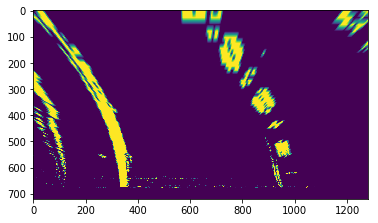

In [253]:
#test = video_pipeline(img)
warped = image_pipeline_perp(img)
#warped = cv2.cvtColor(warped, cv2.COLOR_GRAY2RGB)
plt.imshow(warped)

In [250]:
out, lfit, rfit = image_pipeline_fitting_histo(undistort(img), warped)

error: OpenCV(4.1.0) /Users/travis/build/skvark/opencv-python/opencv/modules/core/src/array.cpp:3229: error: (-215:Assertion failed) cn <= 4 in function 'scalarToRawData'
